# 📖 About Dataset

                                    CVDs Risk Prediction Using Personal Lifestyle Factors

---


**BRFSS Dataset**

---


The Behavioral Risk Factor Surveillance System (BRFSS) is the nation’s premier system of health-related telephone surveys that collect state data about U.S. residents regarding their health-related risk behaviors, chronic health conditions, and use of preventive services.

**Preprocessing of BRFSS Dataset**

---


I preprocessed and cleaned the BRFSS Dataset. From 304 unique variables, I hand-picked 19 variables that relates to lifestyle factors of a person that can be contributed to being at risk with any form of Cardiovascular Diseases.

# 🎯​ My Aim

The main goal of this project is to perform segmentation by grouping individuals based on similarities in their features using unsupervised learning techniques such as clustering.

Once the groups are identified, I analyze each segment to extract insights and statistics. This helps understand the characteristics of each group.

Additionally, I built a classification model to predict the appropriate group for any new individual, so we can instantly display group-specific insights , and this is offered in the app of this project. It is my maid also , anjoy 💫​


---


This is the Link to the [Streamlit app](http://192.168.1.12:8501)

This is the Link to the [code](https://) that I made for this app

# 🔍 importing and describe the data

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans,DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import plotly.express as px
import math
from sklearn.preprocessing import LabelEncoder
import umap
from sklearn.decomposition import KernelPCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [5]:
df=pd.read_csv('/content/CVD_cleaned.csv')
df.head()

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,Poor,Within the past 2 years,No,No,No,No,No,No,Yes,Female,70-74,150.0,32.66,14.54,Yes,0.0,30.0,16.0,12.0
1,Very Good,Within the past year,No,Yes,No,No,No,Yes,No,Female,70-74,165.0,77.11,28.29,No,0.0,30.0,0.0,4.0
2,Very Good,Within the past year,Yes,No,No,No,No,Yes,No,Female,60-64,163.0,88.45,33.47,No,4.0,12.0,3.0,16.0
3,Poor,Within the past year,Yes,Yes,No,No,No,Yes,No,Male,75-79,180.0,93.44,28.73,No,0.0,30.0,30.0,8.0
4,Good,Within the past year,No,No,No,No,No,No,No,Male,80+,191.0,88.45,24.37,Yes,0.0,8.0,4.0,0.0


In [6]:
df.shape

(308854, 19)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308854 entries, 0 to 308853
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   General_Health                308854 non-null  object 
 1   Checkup                       308854 non-null  object 
 2   Exercise                      308854 non-null  object 
 3   Heart_Disease                 308854 non-null  object 
 4   Skin_Cancer                   308854 non-null  object 
 5   Other_Cancer                  308854 non-null  object 
 6   Depression                    308854 non-null  object 
 7   Diabetes                      308854 non-null  object 
 8   Arthritis                     308854 non-null  object 
 9   Sex                           308854 non-null  object 
 10  Age_Category                  308854 non-null  object 
 11  Height_(cm)                   308854 non-null  float64
 12  Weight_(kg)                   308854 non-nul

In [8]:
df.isnull().sum()

,0
General_Health,0
Checkup,0
Exercise,0
Heart_Disease,0
Skin_Cancer,0
Other_Cancer,0
Depression,0
Diabetes,0
Arthritis,0
Sex,0


**✅so,we don't have any Nulls**

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Height_(cm),308854.0,170.615249,10.658026,91.00,163.00,170.00,178.00,241.00
Weight_(kg),308854.0,83.588655,21.343210,24.95,68.04,81.65,95.25,293.02
BMI,308854.0,28.626211,6.522323,12.02,24.21,27.44,31.85,99.33
Alcohol_Consumption,308854.0,5.096366,8.199763,0.00,0.00,1.00,6.00,30.00
Fruit_Consumption,308854.0,29.835200,24.875735,0.00,12.00,30.00,30.00,120.00
Green_Vegetables_Consumption,308854.0,15.110441,14.926238,0.00,4.00,12.00,20.00,128.00
FriedPotato_Consumption,308854.0,6.296616,8.582954,0.00,2.00,4.00,8.00,128.00


In [10]:
df.duplicated().sum()

np.int64(80)

**⚠️ Now we have 80 rows that are duplicated**

# ♻️ preprocessing

In [11]:
df.drop_duplicates(inplace=True)
print(df.duplicated().sum())

0


**✅Now,we don't have any duplicates**

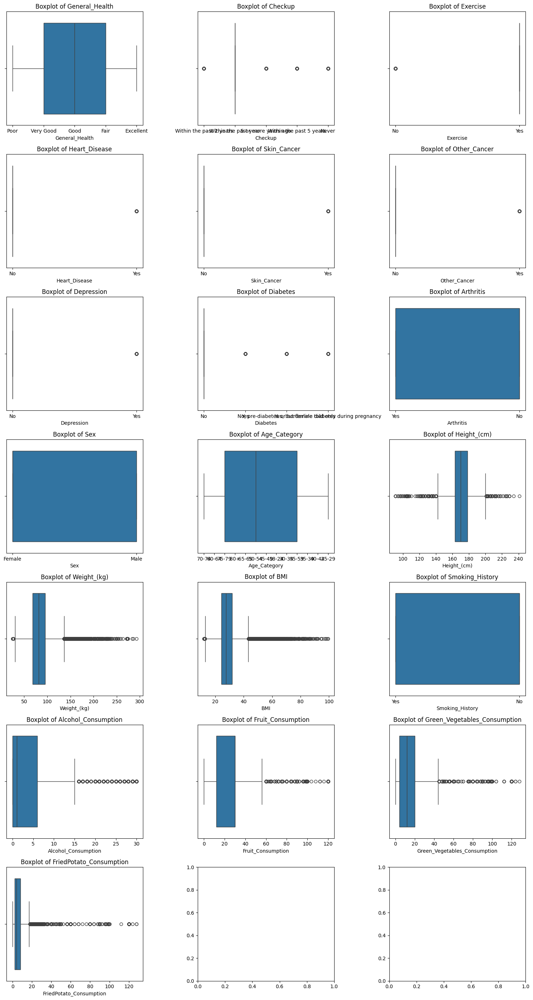

In [12]:
row = math.ceil(len(df.columns) / 3)
fig, ax = plt.subplots(row, 3, figsize=(15, row * 4))
i = 0

for col in df.columns:
    sns.boxplot(x=df[col], ax=ax.flatten()[i])
    ax.flatten()[i].set_title(f'Boxplot of {col}')
    i += 1

plt.tight_layout()
plt.show()

**⚠️ We discover this, we have outliers in our data in `Height_(cm)` , `Weight_(kg)`, `BMI`,`Alcohol_Consumption`, `Fruit_Consumption`,`Green_Vegetables_Consumption`, `FriedPotato_Consumption`**

In [13]:
def remove_outliers_iqr(df, columns=None):
    df_clean = df.copy()

    if columns is None:
        columns = df_clean[['Height_(cm)', 'Weight_(kg)', 'BMI','Alcohol_Consumption', 'Fruit_Consumption','Green_Vegetables_Consumption', 'FriedPotato_Consumption']]

    for col in columns:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]

    return df_clean


The function remove_outliers_iqr is used to clean the dataset by removing outliers based on the Interquartile Range (IQR) method.

For each selected numerical column, it calculates the first quartile (Q1) and the third quartile (Q3), then determines the IQR as the difference between them. Any data point outside the range [Q1 - 1.5 * IQR, Q3 + 1.5 * IQR] is considered an outlier and removed from the dataset.

In [14]:
df = remove_outliers_iqr(df)
print(df.shape)

(185737, 19)


**✅Now, even the data decreased to 185,737, but we don't have any Outliers again**

In [15]:
# from scipy.stats import zscore
# z_scores = df.select_dtypes(include=[np.number]).apply(zscore)
# mask = (np.abs(z_scores) <= 2.5)
# df = df[mask.all(axis=1)]

**Also, we can use Z-scores, but it is sensitive to the number that we write it**

## 🔢 Encoding

In [16]:
encoders = {}

for col in ['Exercise', 'Skin_Cancer', 'Other_Cancer', 'Sex', 'Heart_Disease', 'Smoking_History', 'Depression', 'Arthritis']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    encoders[col] = le


# lambda_encoder = LabelEncoder()
# df['Exercise'] = lambda_encoder.fit_transform(df['Exercise'])
# df['Skin_Cancer'] = lambda_encoder.fit_transform(df['Skin_Cancer'])
# df['Other_Cancer'] = lambda_encoder.fit_transform(df['Other_Cancer'])
# df['Sex'] = lambda_encoder.fit_transform(df['Sex'])
# df['Heart_Disease']=lambda_encoder.fit_transform(df['Heart_Disease'])
# df['Smoking_History']=lambda_encoder.fit_transform(df['Smoking_History'])
# df['Depression']=lambda_encoder.fit_transform(df['Depression'])
# df['Arthritis']=lambda_encoder.fit_transform(df['Arthritis'])

In [17]:
general_health_Map={'Poor':0,'Fair':1,'Good':2,'Very Good':3,'Excellent':4}
df['General_Health']=df['General_Health'].map(general_health_Map)


checkup_Map={ 'Within the past year': 4,
    'Within the past 2 years': 3,
    'Within the past 5 years': 2,
    '5 or more years ago': 1,
    'Never': 0}

df['Checkup']=df['Checkup'].map(checkup_Map)


age_order = [
    '18-24', '25-29', '30-34', '35-39', '40-44', '45-49',
    '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80+'
]

age_mapping = {age: idx for idx, age in enumerate(age_order)}
df['Age_Category'] = df['Age_Category'].map(age_mapping)

diabetes_mapping = {
    'No': 0,
    'No, pre-diabetes or borderline diabetes': 1,
    'Yes, but female told only during pregnancy': 1,
    'Yes': 2
}

df['Diabetes'] = df['Diabetes'].map(diabetes_mapping)

Label Encoding is applied to binary and nominal features such as:

`Exercise`, `Skin_Cancer`, `Other_Cancer`, `Sex`, `Heart_Disease`, `Smoking_History`, `Depression`, and `Arthritis`.

This assigns a unique integer to each category.

Ordinal Encoding is used for ordered categorical features:

**I think that some features that have several non-numeric values may need to be sorted in some tasks**

* `General_Health`: mapped from 'Poor' (0) to 'Excellent' (4), preserving health status order.

* `Checkup`: transformed based on recency of checkups, from 'Never' (0) to 'Within the past year' (4).

* `Age_Category`: mapped according to increasing age groups to maintain chronological order.

Custom Mapping for `Diabetes`:

* 'No' → 0

* Pre-diabetic and pregnancy-related diabetes → 1

* Confirmed diabetes → 2

In [18]:
# general_health_Map={'Poor':0,'Fair':1,'Good':2,'Very Good':3,'Excellent':4}
# df['General_Health']=df['General_Health'].map(general_health_Map)

# df=pd.get_dummies(df,columns=['Age_Category'],dtype=int,drop_first=True)
# df=pd.get_dummies(df,columns=['Diabetes'],dtype=int,drop_first=True)
# df=pd.get_dummies(df,columns=['Checkup'],dtype=int,drop_first=True)

Also, we can apply one-hot-encoding to `Age_Category` , `Diabetes` , `checkup`, but with my try, I found annoying distraction in clustering


# 📏 scaling

In [19]:
x_train=df[['Sex', 'Age_Category', 'Exercise', 'Smoking_History',
    'Alcohol_Consumption', 'Fruit_Consumption',
    'Green_Vegetables_Consumption', 'FriedPotato_Consumption',
    'General_Health', 'Checkup', 'BMI']]

**we don't take `Height_(cm)` , `Weight_(kg)` because `BMI` give me the same meaning**

In [20]:
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)

**✅Now, we scaled the data to prepare it for clustering**

# PCA

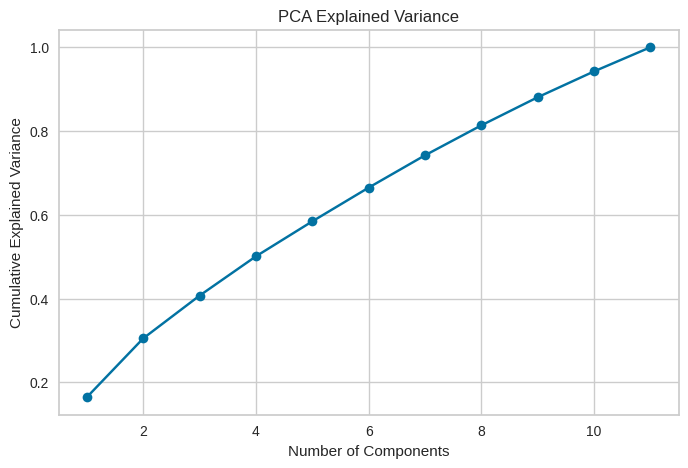

In [ ]:
pca = PCA().fit(x_train_scaled)
explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
pca = PCA(n_components=0.90)
X_pca = pca.fit_transform(x_train_scaled)

print(f'Number of Components selected: {X_pca.shape[1]}')

Number of Components selected: 10


In [ ]:
interia=[]
k=[]
for i in range(2,11):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
  kmeans.fit(X_pca)
  interia.append(kmeans.inertia_)
  k.append(i)

Text(0.5, 1.0, 'The Elbow Method')

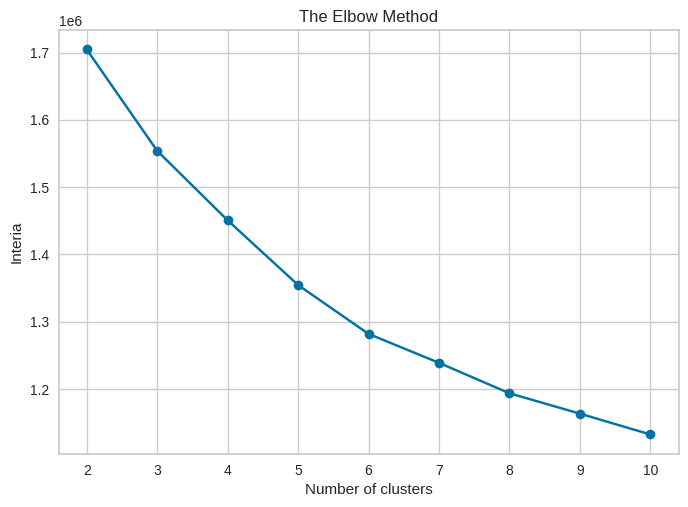

In [ ]:
plt.plot(k,interia,'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Interia')
plt.title('The Elbow Method')

In [ ]:
scores=[]
k=[]
for i in range(2,11):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
  kmeans.fit(X_pca)
  scores.append(silhouette_score(X_pca,kmeans.labels_))
  print(i,scores[-1])
  k.append(i)

2 0.11247923558912191
3 0.10942651000396514
4 0.10308285961141245
5 0.11487792106707004
6 0.11221502025608741
7 0.10360455604974478
8 0.11179142122790645
9 0.10071616312799712
10 0.10202112518931292


Text(0.5, 1.0, 'The Elbow Method')

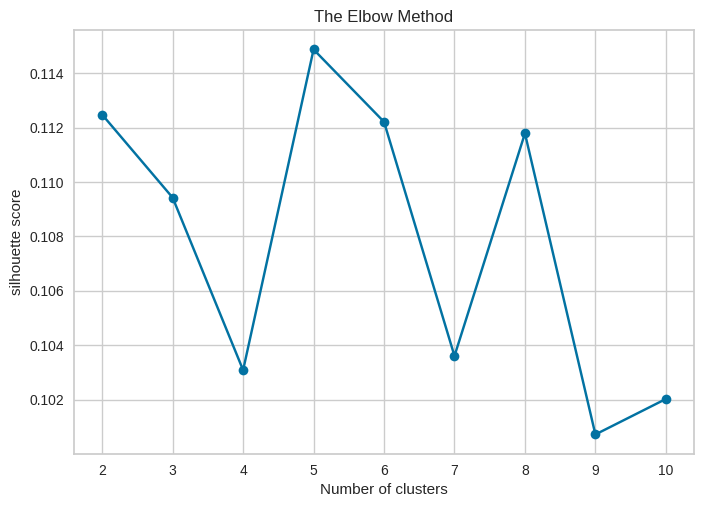

In [ ]:
plt.plot(k,scores,'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('silhouette score')
plt.title('The Elbow Method')

In [ ]:
pca = PCA(n_components=3)
X_pca_2d = pca.fit_transform(x_train_scaled)

print(f'Number of Components selected: {X_pca_2d.shape[1]}')

Number of Components selected: 3


<Axes: >

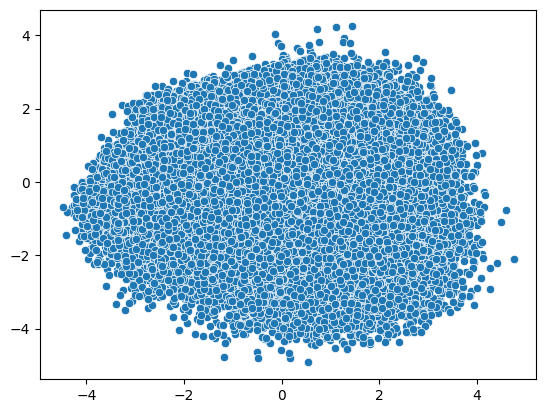

In [ ]:
sns.scatterplot(x=X_pca_2d[:,0],y=X_pca_2d[:,1])

**Now PCA gives me weak results, and it does not represent the data to me in all its clear dimensions, so it is only one block of data. Let us try UMP for dimension reduction**

# UMAP

**UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction**

---

UMAP is a nonlinear dimensionality reduction technique that works well with complex datasets. Unlike PCA, which preserves global variance linearly, UMAP focuses on preserving local structure, making it ideal for clustering and visualizing high-dimensional data.

It captures nonlinear relationships, scales well, and keeps the underlying data structure better than PCA

In [21]:
reducer = umap.UMAP(n_components=7, min_dist=0.05, n_neighbors=20, random_state=42)
X_umap = reducer.fit_transform(x_train_scaled)

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


# Kmeans

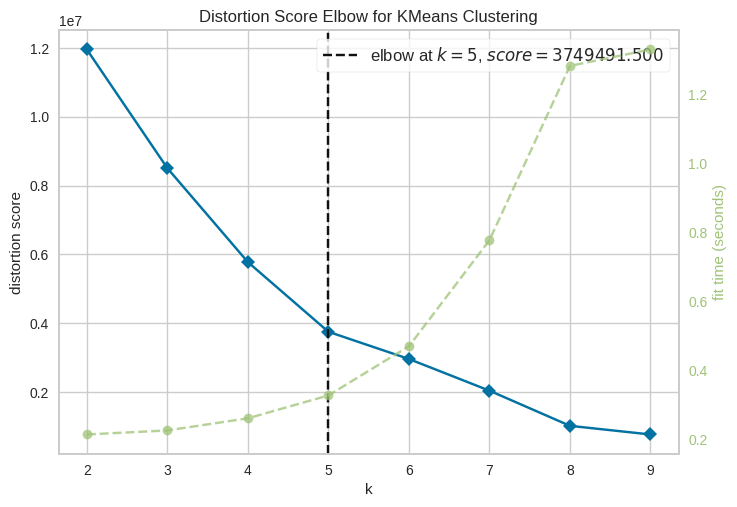

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
km = KMeans(random_state=42)
visualizer = KElbowVisualizer(km, k=(2,10))

visualizer.fit(X_umap)
visualizer.show()

**The Elbow visualization gives me that the number 5 for K in K-Means is the best given to the inertia**

In [262]:
scores=[]
k=[]
for i in range(2,11):
  kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
  kmeans.fit(X_umap)
  scores.append(silhouette_score(X_umap,kmeans.labels_))
  print(i,scores[-1])
  k.append(i)

2 0.28023118
3 0.42041415
4 0.53435075
5 0.6355989
6 0.6649756
7 0.71485764
8 0.7765134
9 0.74921227
10 0.6625521


Text(0.5, 1.0, 'The Elbow Method')

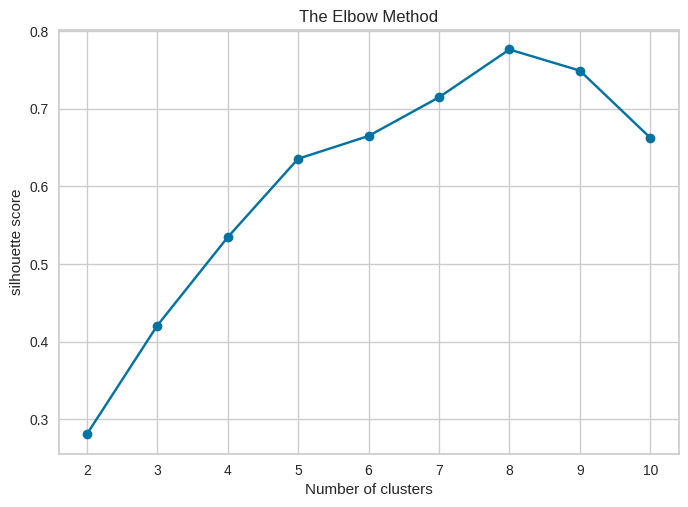

In [263]:
plt.plot(k,scores,'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('silhouette score')
plt.title('The Elbow Method')

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import numpy as np

def plot_kmeans_silhouette(X, cluster_range):
    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(X)

        silhouette_avg = silhouette_score(X, labels)
        sample_silhouette_values = silhouette_samples(X, labels)

        fig, ax1 = plt.subplots(1, 1)
        fig.set_size_inches(8, 5)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = plt.cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        ax1.set_title(f"Silhouette Plot for k={n_clusters} (avg={silhouette_avg:.2f})")
        ax1.set_xlabel("Silhouette Coefficient")
        ax1.set_ylabel("Cluster Label")
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])
        plt.show()


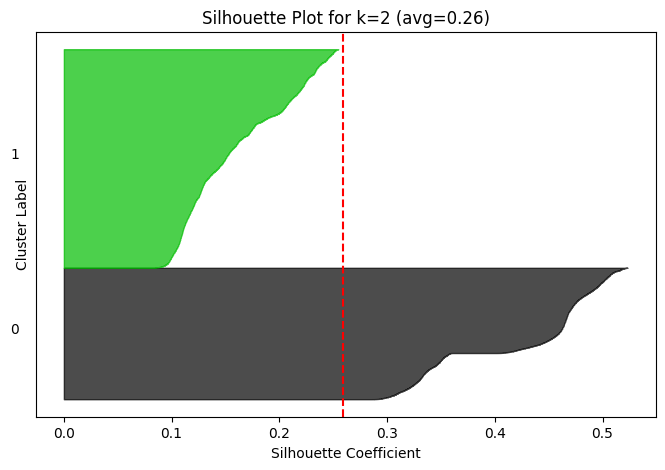

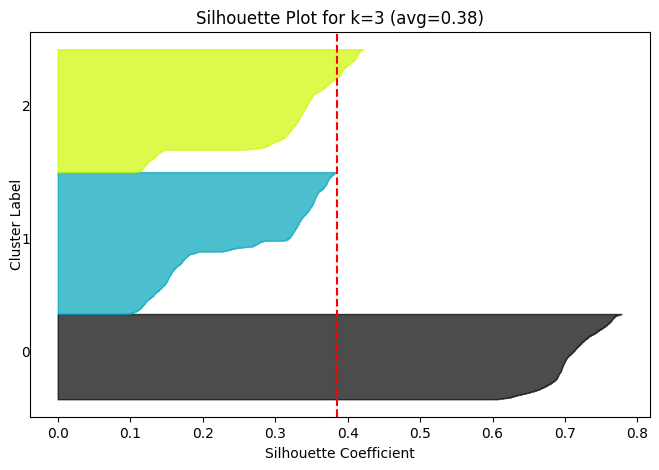

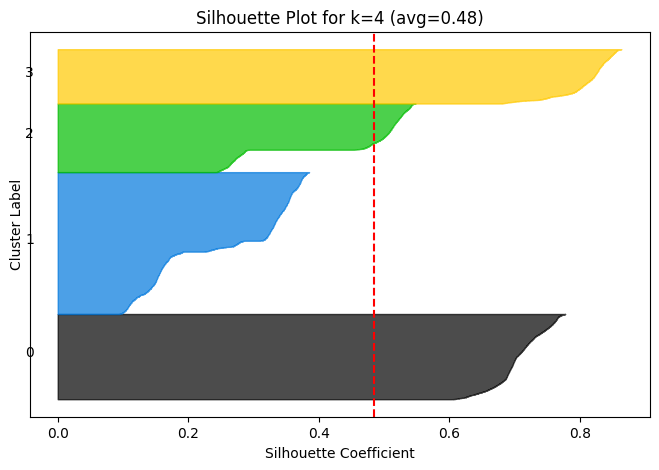

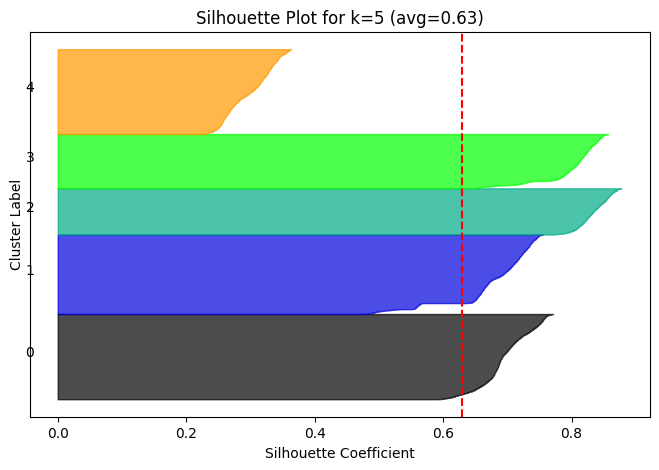

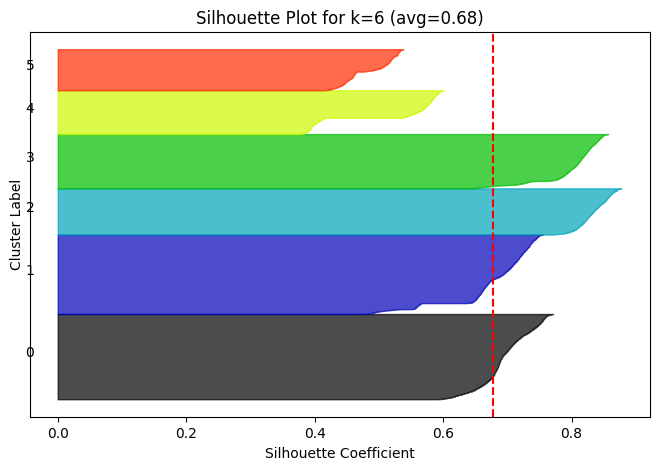

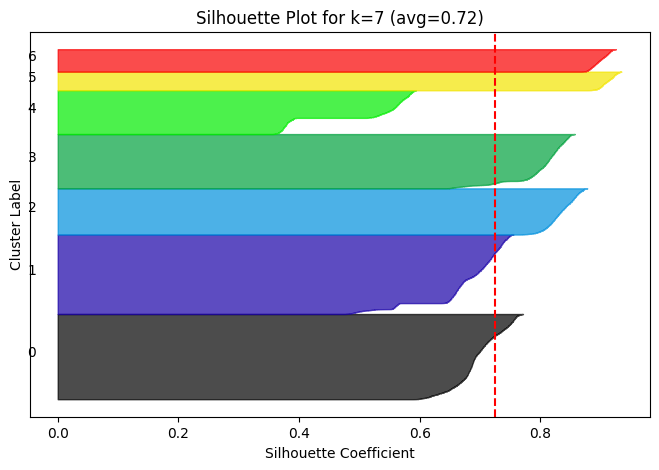

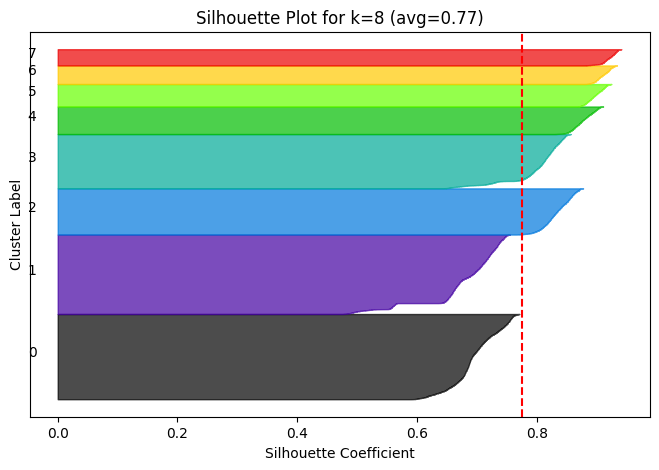

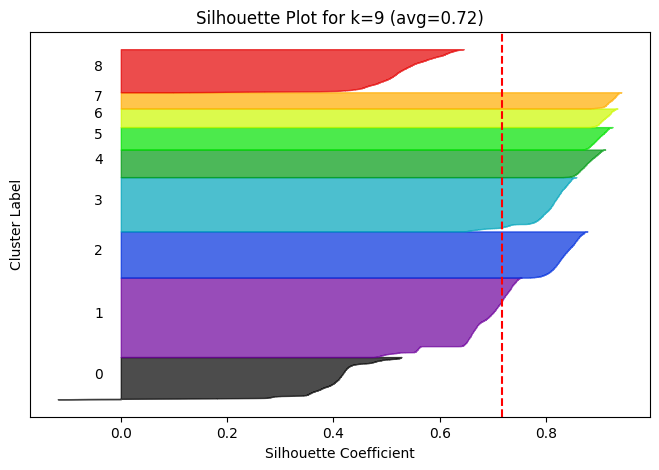

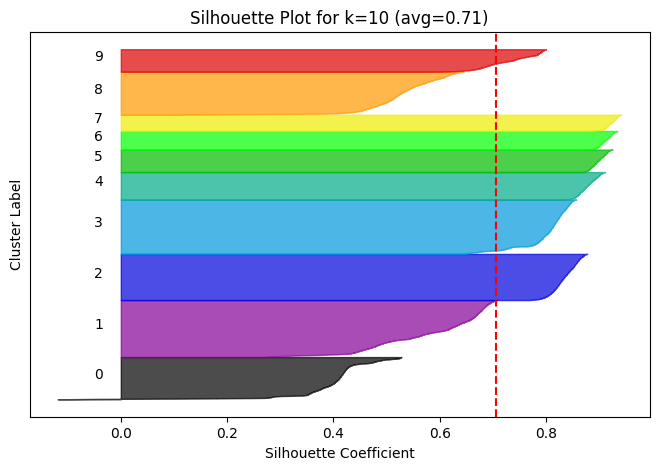

In [ ]:
plot_kmeans_silhouette(X_umap, cluster_range=range(2, 11))

**Okay! We have many diagrams that can be good for our case, but let me focus on `K=5` and `K=8`, because 5 is the best in the elbow diagram, and 8 is the best in the silhouette score**

**To make it short, I trained KMeans twice for a comprehensive comparison between the two values, and then I noticed through the heat map that the value 8 creates more correlation values with diseases than the value 5, and here is this:**



---

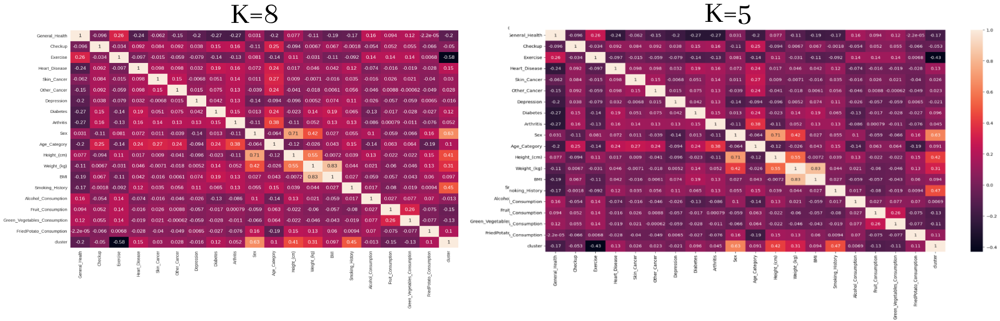

In [22]:
kmeans=KMeans(n_clusters=8,init='k-means++',random_state=42)
kmeans.fit(X_umap)

KMeans(random_state=42)

In [25]:
silhouette_score(X_umap,kmeans.labels_)

np.float32(0.7765134)

In [27]:
reducer = umap.UMAP(n_components=3)
X_umap_3d = reducer.fit_transform(x_train_scaled)

<Axes: >

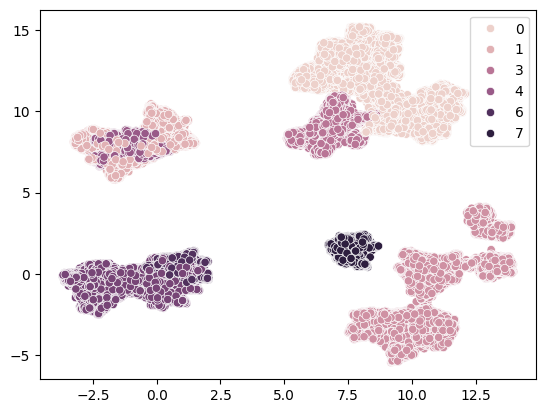

In [28]:
sns.scatterplot(x=X_umap_3d[:,0],y=X_umap_3d[:,1],hue=kmeans.labels_)

**This is the 2D visualization, but it is not expressive**

In [29]:
fig = px.scatter_3d(X_umap_3d, x=X_umap_3d[:,0], y=X_umap_3d[:,1], z=X_umap_3d[:,2]
                ,color=kmeans.labels_)
fig.show()

**Now, the 3D visualization shows that the clusters are very specific (This is just for illustration and not a measure)**

In [30]:
data_labeld=x_train.copy()
data_labeld['cluster']=kmeans.labels_
data_labeld.head(10)

,Sex,Age_Category,Exercise,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption,General_Health,Checkup,BMI,cluster
0,0,10,0,1,0.0,30.0,16.0,12.0,0,3,14.54,4
1,0,10,0,0,0.0,30.0,0.0,4.0,3,4,28.29,3
2,0,8,1,0,4.0,12.0,3.0,16.0,3,4,33.47,0
3,1,11,1,0,0.0,30.0,30.0,8.0,0,4,28.73,2
4,1,12,0,1,0.0,8.0,4.0,0.0,2,4,24.37,6
6,1,8,1,1,0.0,16.0,8.0,0.0,1,4,22.74,5
7,0,9,1,1,3.0,30.0,8.0,8.0,2,4,39.94,1
8,0,9,0,1,0.0,12.0,12.0,4.0,1,4,27.46,4
9,0,10,0,0,0.0,12.0,12.0,1.0,1,4,34.67,3
10,0,11,1,0,0.0,30.0,20.0,2.0,1,4,29.23,0


<Axes: >

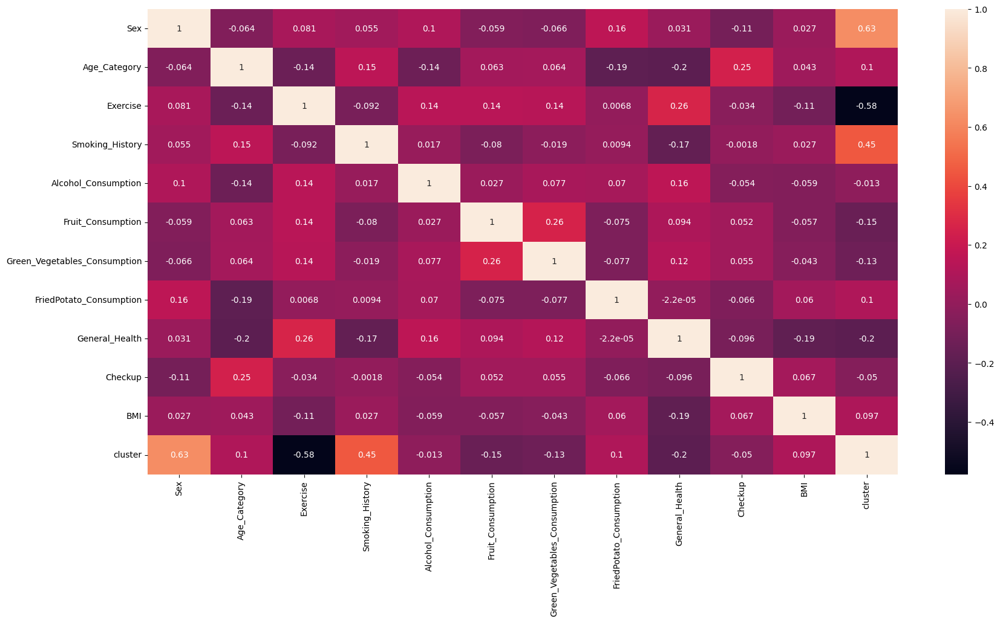

In [31]:
plt.figure(figsize=(20,10))
sns.heatmap(data_labeld.corr(),annot=True)

# 📈 Analyze the clusters

<Axes: xlabel='cluster', ylabel='count'>

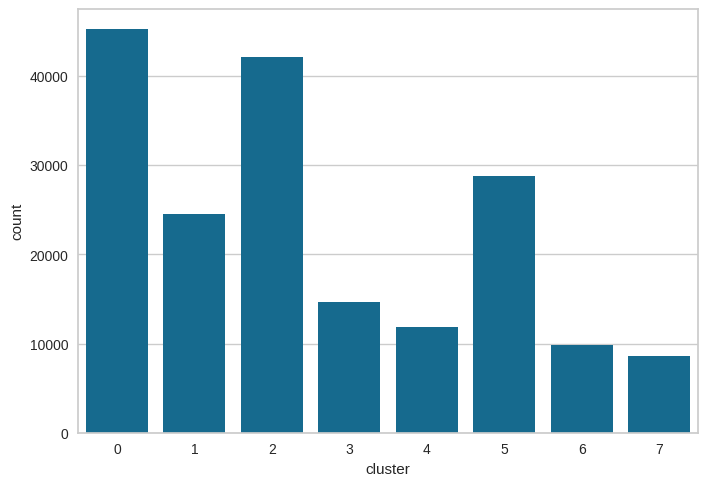

In [ ]:
sns.countplot(x='cluster',data=data_labeld)

In [ ]:
data_labeld['cluster'].value_counts()

,count
cluster,
0,45232
2,42170
5,28806
1,24512
3,14630
4,11909
6,9878
7,8600


**So, we see that the clusters are not balanced as we also show (in the silhouette diagrams for various values of k with k=8), I think this is necessary to separate the properties of each cluster from the other.**

In [24]:
df_final=df.copy()
df_final['cluster']=kmeans.labels_
df_final.head(10)

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption,cluster
0,0,3,0,0,0,0,0,0,1,0,10,150.0,32.66,14.54,1,0.0,30.0,16.0,12.0,4
1,3,4,0,1,0,0,0,2,0,0,10,165.0,77.11,28.29,0,0.0,30.0,0.0,4.0,3
2,3,4,1,0,0,0,0,2,0,0,8,163.0,88.45,33.47,0,4.0,12.0,3.0,16.0,0
3,0,4,1,1,0,0,0,2,0,1,11,180.0,93.44,28.73,0,0.0,30.0,30.0,8.0,2
4,2,4,0,0,0,0,0,0,0,1,12,191.0,88.45,24.37,1,0.0,8.0,4.0,0.0,6
6,1,4,1,1,0,0,0,0,1,1,8,175.0,69.85,22.74,1,0.0,16.0,8.0,0.0,5
7,2,4,1,0,0,0,0,0,1,0,9,165.0,108.86,39.94,1,3.0,30.0,8.0,8.0,1
8,1,4,0,0,0,0,1,0,0,0,9,163.0,72.57,27.46,1,0.0,12.0,12.0,4.0,4
9,1,4,0,0,0,0,0,2,1,0,10,163.0,91.63,34.67,0,0.0,12.0,12.0,1.0,3
10,1,4,1,1,0,0,0,0,1,0,11,160.0,74.84,29.23,0,0.0,30.0,20.0,2.0,0


<Axes: >

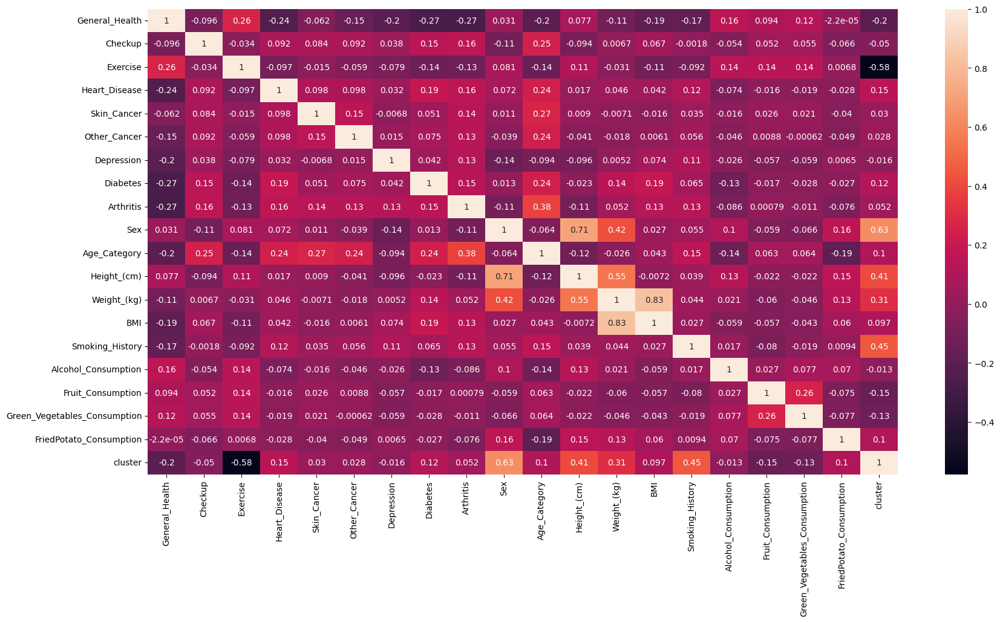

In [33]:
plt.figure(figsize=(20, 10))
sns.heatmap(df_final.corr(),annot=True)

## Relationship of Clusters with Features


In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.colors

columns = ['Sex', 'Age_Category', 'Exercise', 'Smoking_History',
           'Alcohol_Consumption', 'Fruit_Consumption',
           'Green_Vegetables_Consumption', 'FriedPotato_Consumption',
           'General_Health', 'Checkup', 'BMI']

clusters = sorted(df_final['cluster'].unique())

n_rows = len(columns)
n_cols = len(clusters)

fig = make_subplots(rows=n_rows, cols=n_cols,
                    subplot_titles=[f"cluster:{c}" for col in columns for c in clusters])

for i, col in enumerate(columns, 1):
    for j, cluster in enumerate(clusters, 1):
        cluster_data = df_final[df_final['cluster'] == cluster]

        if col in ['BMI', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption']:
            fig.add_trace(
                go.Box(y=cluster_data[col], name=f'Cluster {cluster}', jitter=0.3,
                       marker_color=plotly.colors.qualitative.Plotly[0]),
                row=i, col=j
            )
        else:
            value_counts = cluster_data[col].value_counts(normalize=True) * 100
            n_colors = len(value_counts.index)
            colors = plotly.colors.qualitative.Plotly[:n_colors]

            fig.add_trace(
                go.Bar(
                    x=value_counts.index,
                    y=value_counts.values,
                    text=[f'{v:.1f}%' for v in value_counts.values],
                    textposition='auto',
                    marker_color=colors
                ),
                row=i, col=j
            )


fig.update_layout(
    height=700 * n_rows,
    width=175 * n_cols,
    title_text="Relationship of Clusters with Features",
    showlegend=False
)

for i in range(1, n_rows + 1):
    for j in range(1, n_cols + 1):
        if columns[i-1] in ['BMI', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption']:
            fig.update_yaxes(title_text=columns[i-1], row=i, col=j)
            fig.update_xaxes(title_text="Distribution", row=i, col=j)
        else:
            fig.update_xaxes(title_text=columns[i-1], row=i, col=j)

fig.show()

## Disease Prevalence Across Clusters

In [ ]:
disease_columns = ['Heart_Disease', 'Diabetes', 'Skin_Cancer', 'Arthritis', 'Depression']

clusters = sorted(df_final['cluster'].unique())

fig = make_subplots(rows=5, cols=len(clusters),
                    subplot_titles=[f"{col}:{c}" for col in disease_columns for c in clusters])

for i, col in enumerate(disease_columns, 1):
    for j, cluster in enumerate(clusters, 1):
        cluster_data = df_final[df_final['cluster'] == cluster]

        value_counts = cluster_data[col].value_counts(normalize=True) * 100

        labels = []
        values = []
        for value in sorted(value_counts.index):
            if value == 0:
                labels.append('No')
            elif value == 1:
                labels.append('Yes')
            else:
                labels.append('May')
            values.append(value_counts.get(value, 0))


        fig.add_trace(
            go.Bar(
                y=labels,
                x=values,
                orientation='h',
                text=[f'{v:.1f}%' for v in values],
                textposition='auto',
                marker_color=['#87CEEB', '#FFB6C1', '#98FB98']
            ),
            row=i, col=j
        )


fig.update_layout(
    height=200 * len(disease_columns),
    width=150 * len(clusters),
    title_text="Disease Prevalence Across Clusters",
    showlegend=False
)


for i in range(1, 6):
    for j in range(1, len(clusters) + 1):

        fig.update_xaxes(title_text="Percentage (%)", row=i, col=j)


fig.show()

# 🔭 Predict the cluster

In [35]:
x_cluster=df_final.drop(['Heart_Disease','Diabetes', 'Other_Cancer','Skin_Cancer', 'Arthritis', 'Depression','cluster','Height_(cm)','Weight_(kg)'],axis=1)
y_cluster=df_final['cluster']

In [36]:
x_cluster

,General_Health,Checkup,Exercise,Sex,Age_Category,BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,0,3,0,0,10,14.54,1,0.0,30.0,16.0,12.0
1,3,4,0,0,10,28.29,0,0.0,30.0,0.0,4.0
2,3,4,1,0,8,33.47,0,4.0,12.0,3.0,16.0
3,0,4,1,1,11,28.73,0,0.0,30.0,30.0,8.0
4,2,4,0,1,12,24.37,1,0.0,8.0,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
308848,2,2,1,1,7,20.98,0,0.0,16.0,12.0,0.0
308849,3,4,1,1,1,29.05,0,4.0,30.0,8.0,0.0
308851,3,1,1,0,2,24.69,1,4.0,40.0,8.0,4.0
308852,3,4,1,1,9,23.73,0,3.0,30.0,12.0,0.0


In [37]:
x_train_cluster,x_test_cluster,y_train_cluster,y_test_cluster=train_test_split(x_cluster,y_cluster,test_size=0.2,random_state=42)

In [38]:
scaler_cluster=StandardScaler()
x_train_cluster_scaled=scaler_cluster.fit_transform(x_train_cluster)
x_test_cluster_scaled=scaler_cluster.transform(x_test_cluster)

In [39]:
random_forest_cluster=RandomForestClassifier(n_estimators=200,random_state=42)
random_forest_cluster.fit(x_train_cluster_scaled,y_train_cluster)
y_pred_cluster=random_forest_cluster.predict(x_test_cluster_scaled)
print("accuracy: ",accuracy_score(y_test_cluster,y_pred_cluster))

accuracy:  0.9999730806503715


In [40]:
print("classification_report: \n",classification_report(y_test_cluster,y_pred_cluster))

classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      9053
           1       1.00      1.00      1.00      4947
           2       1.00      1.00      1.00      8441
           3       1.00      1.00      1.00      2867
           4       1.00      1.00      1.00      2382
           5       1.00      1.00      1.00      5748
           6       1.00      1.00      1.00      1968
           7       1.00      1.00      1.00      1742

    accuracy                           1.00     37148
   macro avg       1.00      1.00      1.00     37148
weighted avg       1.00      1.00      1.00     37148



**⚠️ Now this seems a bit too perfect!! It raises my suspicions about a `data leak`, so let's try another experiment :**

In [41]:
x_train_cluster, x_test_cluster, _, _ = train_test_split(x_cluster, y_cluster, test_size=0.2, random_state=42)


scaler = StandardScaler()
x_train_cluster_scaled = scaler.fit_transform(x_train_cluster)
x_test_cluster_scaled = scaler.transform(x_test_cluster)


kmeans = KMeans(n_clusters=8,init='k-means++', random_state=42)
y_train_cluster = kmeans.fit_predict(x_train_cluster_scaled)

y_test_cluster = kmeans.predict(x_test_cluster_scaled)

random_forest_cluster = RandomForestClassifier(n_estimators=200, random_state=42)
random_forest_cluster.fit(x_train_cluster_scaled, y_train_cluster)

y_pred_cluster = random_forest_cluster.predict(x_test_cluster_scaled)

print("Accuracy: ", accuracy_score(y_test_cluster, y_pred_cluster))
print("Classification Report: \n", classification_report(y_test_cluster, y_pred_cluster))

Accuracy:  0.9828523742866372
Classification Report: 
               precision    recall  f1-score   support

           0       0.97      0.98      0.98      3122
           1       0.99      0.99      0.99      5952
           2       0.97      0.96      0.97      4565
           3       0.99      0.99      0.99      5327
           4       0.99      0.99      0.99      6477
           5       0.98      0.97      0.97      3737
           6       0.98      0.99      0.98      4605
           7       0.98      0.99      0.99      3363

    accuracy                           0.98     37148
   macro avg       0.98      0.98      0.98     37148
weighted avg       0.98      0.98      0.98     37148



**Now I actually think that there was a data leak so, we separated the `x_cluster` again, but we took the `y_cluster` from the K-Means Predict but the percentage is still very high I think that this is because the model is more complex than necessary for this data or there is a mistake that they have not discovered yet (if you reach any comment or clarification to me please get in touch with me at any time because I am ready for that, I am also learning)**

# 🟥 Preparing for Streamlit App

In [33]:
import joblib

joblib.dump(encoders, 'label_encoders.pkl')

['label_encoders.pkl']

In [2]:
import json

mappings = {
    'General_Health': {'Poor': 0, 'Fair': 1, 'Good': 2, 'Very Good': 3, 'Excellent': 4},
    'Checkup': {
        'Within the past year': 4,
        'Within the past 2 years': 3,
        'Within the past 5 years': 2,
        '5 or more years ago': 1,
        'Never': 0
    },
    'Age_Category': {
        '18-24': 0, '25-29': 1, '30-34': 2, '35-39': 3, '40-44': 4, '45-49': 5,
        '50-54': 6, '55-59': 7, '60-64': 8, '65-69': 9, '70-74': 10, '75-79': 11, '80+': 12
    },
    'Diabetes': {
        'No': 0,
        'No, pre-diabetes or borderline diabetes': 1,
        'Yes, but female told only during pregnancy': 1,
        'Yes': 2
    }
}

with open("mappings.json", "w") as f:
    json.dump(mappings, f)

In [44]:
joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']

In [43]:
joblib.dump(random_forest_cluster, 'random_forest_cluster.pkl')

['random_forest_cluster.pkl']

In [30]:
df_final.to_csv('labeled_data.csv', index=False)

# 🏁 Finally

**this is the [Streamlit App](http://192.168.1.12:8501), and this is his [App code](https://), and I would be happy to receive any feedback on this project 🥰**